# Proyecto de aplicación de filtros digitales
**Realizado por :**
* *Victor Manuel Arbeláez Ramírez*
* *Kevin Santiago Restrepo Alzate*  

In [1]:
#!pip install librosa

# Librerias

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from scipy.io.wavfile import read
from IPython.display import Audio 
from scipy.signal import freqz, lfilter

# Cargamos el audio

In [3]:
ruta = "audio1.wav"
fs, audio = read(ruta) #frecuencia de muestreo,señal de audio
audio = audio / max(audio) # normalización del audio
tiempo = np.arange(0,len(audio)/fs,1/fs) # vector de tiempo
Audio(audio,rate = fs) # reproducir audio cargado


## Gráfica del audio original

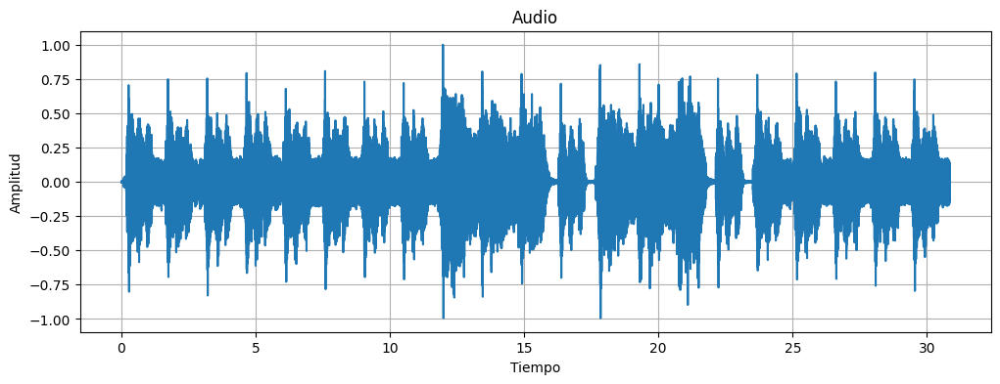

In [4]:
tiempo = np.arange(0,len(audio)/fs,1/fs) # vector de tiempo

# grafica
plt.figure(figsize=(12,4))
plt.plot(tiempo,audio)
plt.title("Audio")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid()
plt.show()


## Espectrograma del audio original

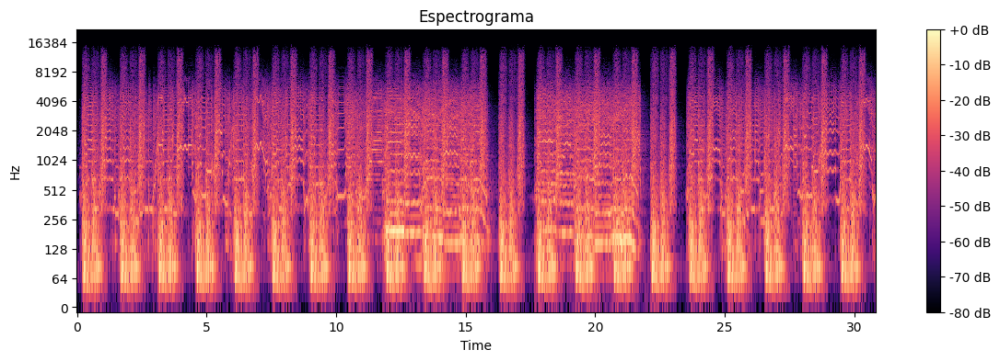

In [5]:
# Usar librosa para convertir la señal de audio a espectrograma
D = librosa.amplitude_to_db(np.abs(librosa.stft(audio)), ref=np.max)

# Crear el gráfico del espectrograma
plt.figure(figsize=(14, 4))
librosa.display.specshow(D, sr=fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma')
plt.show()

# Filtro FIR pasa-bajas por el metodo de enventanado

## Parámetros del filtro

In [6]:
# Parametros del filtro FIR pasa-bajas
fc = 1000  # frecuencia de corte
ripple = 20 * np.log10(0.1 / 100) # ripple
print("Ripple = {} dB".format(ripple))
delta_f = 50 # roll-of
Wc = (2 * np.pi * fc) / fs # frecuencia de corte normalizada
M = int((6 * fs) / delta_f) # numero de coeficientes
if M%2 == 0:
    M += 1
print("M = {}".format(M))

Ripple = -60.0 dB
M = 5293


## Respuesta al impulso del filtro sin enventanado

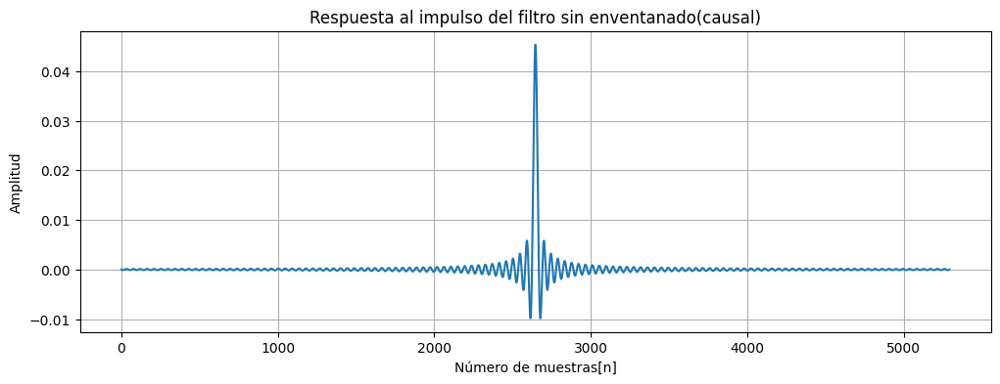

In [7]:
hi= []
# terminos negativos
for i in range(-int((M-1)/2),0,1):
    hi.append((Wc / np.pi) * (np.sin(i * Wc) / (Wc * i) ))

hi.append(Wc/np.pi) # termino 0
# terminos positivos
for i in range(1,int((M-1)/2)+1,1):
    hi.append((Wc / np.pi) * (np.sin(i * Wc) / (Wc * i) ))

n = np.arange(0,M,1) # vector con el numero de muestras

#grafica
plt.figure(figsize=(12,4))
plt.plot(n,hi)
plt.grid()
plt.title("Respuesta al impulso del filtro sin enventanado(causal)")
plt.xlabel("Número de muestras[n]")
plt.ylabel("Amplitud")
plt.show()

## Ventana Blackman

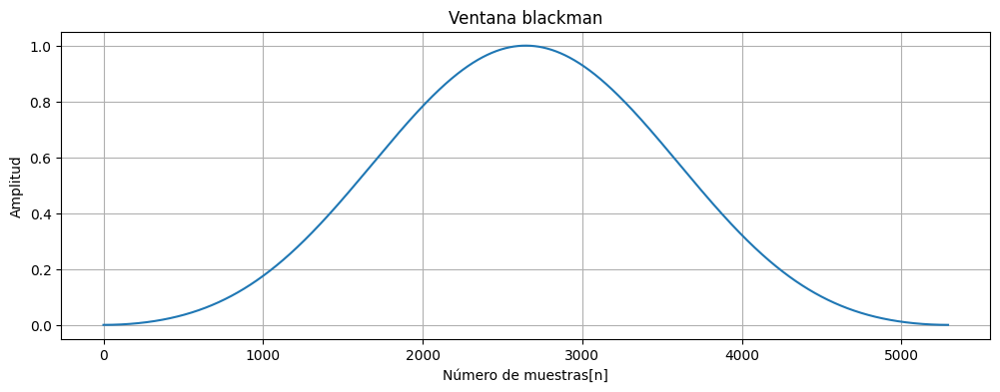

In [8]:
# Ventana blackman
blackman = []
for i in range(0,M,1): # se aplica ecuación para crear la ventana blackman
    valor = 0.42 - 0.5 * np.cos((2 * np.pi * i) / (M -1)) + 0.08 * np.cos((4 * np.pi * i) / (M-1))
    blackman.append(valor)

# grafica
plt.figure(figsize=(12,4))
plt.plot(n,blackman)
plt.grid()
plt.title("Ventana blackman")
plt.xlabel("Número de muestras[n]")
plt.ylabel("Amplitud")
plt.show()

## Respuesta al impulso del filtro enventanado

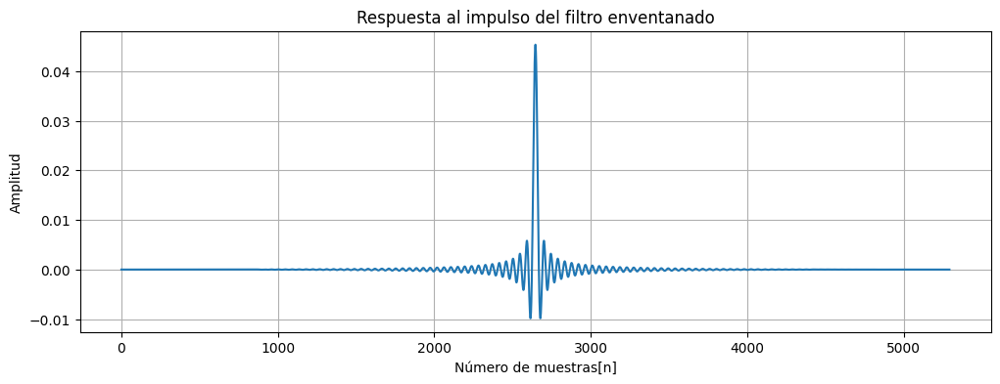

In [9]:
pasabajas = [] # producto entre la ventana y hi'(n)
for i in range(0,len(hi),1):
    pasabajas.append(hi[i]*blackman[i])

#grafica
plt.figure(figsize=(12,4))
plt.plot(n,pasabajas)
plt.grid()
plt.title("Respuesta al impulso del filtro enventanado")
plt.xlabel("Número de muestras[n]")
plt.ylabel("Amplitud")
plt.show()

## Respuesta en frecuencia del filtro enventanado

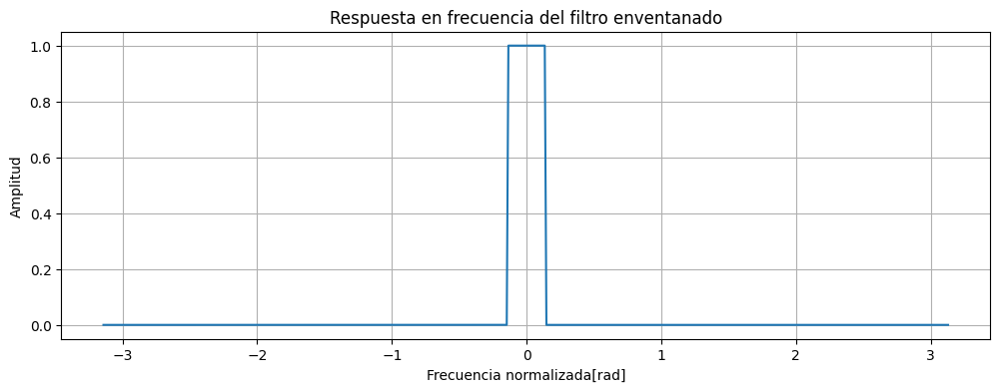

In [10]:
# Aplicar la Transformada de Fourier
w1,H = freqz(pasabajas,1,whole = True,worN=512) # Respuesta en frecuencia

# Grafica
plt.figure(figsize=(12,4))
plt.plot(w1-np.pi,np.abs(np.fft.fftshift(H)))
plt.grid()
plt.title("Respuesta en frecuencia del filtro enventanado")
plt.xlabel("Frecuencia normalizada[rad]")
plt.ylabel("Amplitud")
plt.show()

## Señal filtrada mediante filtro FIR por el metodo de enventanado

In [11]:
audio_filtrado = lfilter(pasabajas, 1, audio) # se aplica el filtro al audio original
Audio(audio_filtrado,rate = fs)

## Gráfica de la señal filtrada 

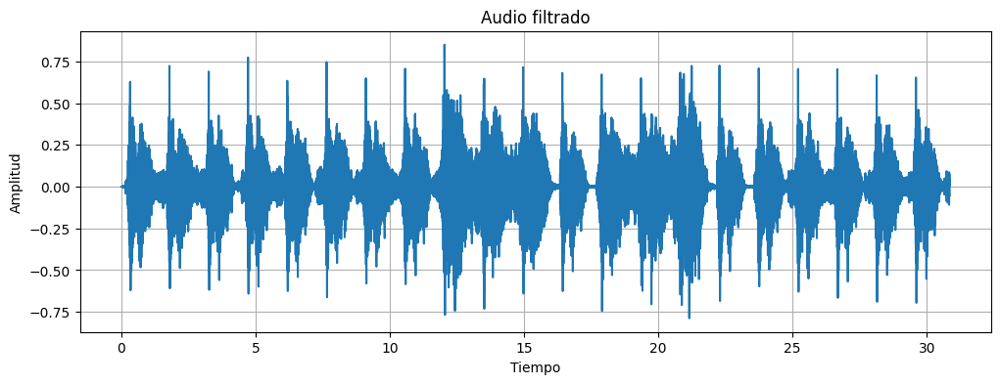

In [12]:
# grafica
plt.figure(figsize=(12,4))
plt.plot(tiempo,audio_filtrado)
plt.title("Audio filtrado")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid()
plt.show()

## Espectrograma de la señal filtrada

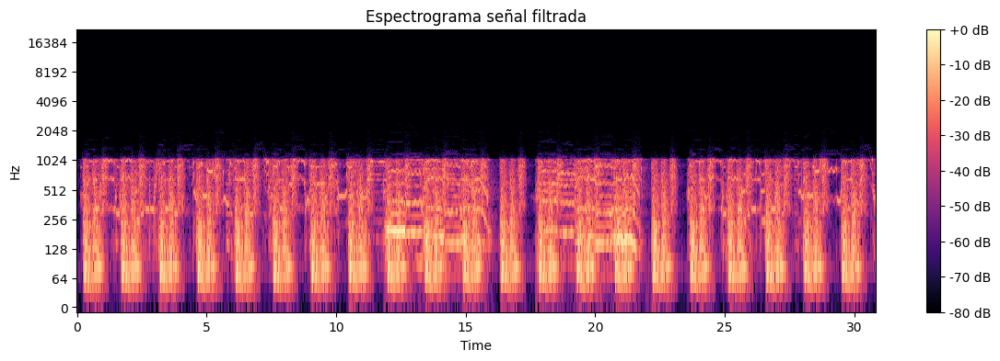

In [22]:
# Usar librosa para convertir la señal de audio a espectrograma
D_filtrada = librosa.amplitude_to_db(np.abs(librosa.stft(audio_filtrado)), ref=np.max)

# Crear el gráfico del espectrograma
plt.figure(figsize=(14, 4))
librosa.display.specshow(D_filtrada, sr=fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma señal filtrada')
plt.show()

# Filtro FIR pasa-bajas por el metodo de muestreo en frecuencia

## Respuesta al impulso del filtro

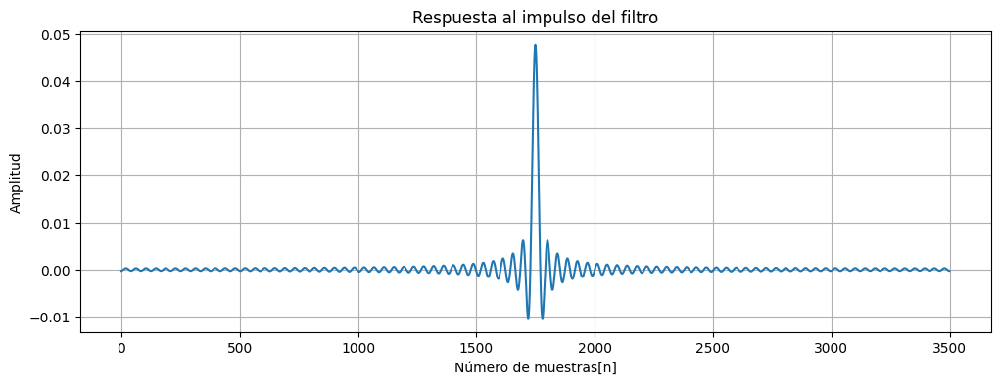

In [14]:
N = 3500 # numero de muestras
paso = int(fs / N) # tamaño de paso

Hk = [] # Valores de HK
for i in range(0,int((N-1) / 2),1): # asignamos valores a HK
    if i * paso <= fc:
        Hk.append(1)
    else:
        Hk.append(0)

alpha = int((N-1)/2) 
H0 = 1
h = []
for n in range(0,N,1): # ecuacion para la respuesta al impulso
    formula = 0
    for k in range(1,int((N-1)/2),1): # se realiza la sumatoria
        formula += 2 * Hk[k] * np.cos((2 * np.pi * k * (n-alpha))/N) 
    
    formula += H0 # se adiciona el termino H(0) de la ecuación
    formula = (1 / N) * formula
    h.append(formula)

# grafica
plt.figure(figsize=(12,4))
plt.plot(h)
plt.grid()
plt.title("Respuesta al impulso del filtro")
plt.xlabel("Número de muestras[n]")
plt.ylabel("Amplitud")
plt.show()


## Respuesta en frecuencia del filtro

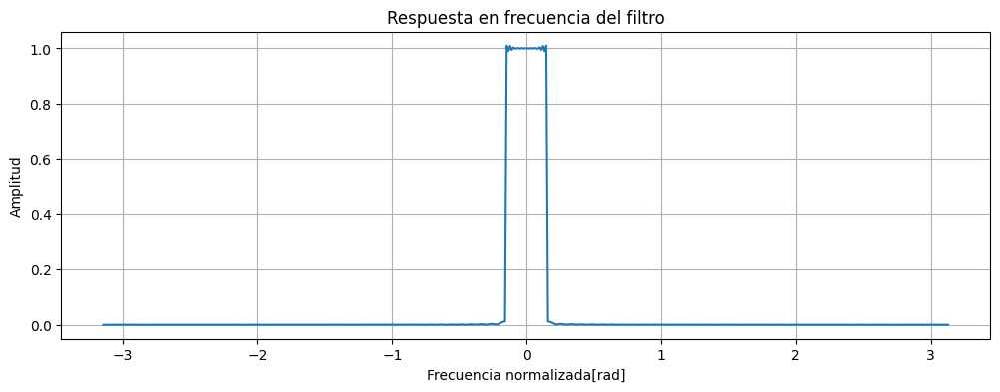

In [15]:
# Aplicar la Transformada de Fourier
w1,H = freqz(h,1,whole = True,worN=512) # Respuesta en frecuencia

# Graficar la magnitud de la transformada de Fourier
plt.figure(figsize=(12,4))
plt.plot(w1-np.pi,np.abs(np.fft.fftshift(H)))
plt.grid()
plt.title("Respuesta en frecuencia del filtro")
plt.xlabel("Frecuencia normalizada[rad]")
plt.ylabel("Amplitud")
plt.show()

## Señal filtrada con el filtro de muestreo por frecuencia

In [16]:
audio_filtrado = lfilter(h, 1, audio)
Audio(audio_filtrado,rate = fs)


## Gráfica del audio filtrado

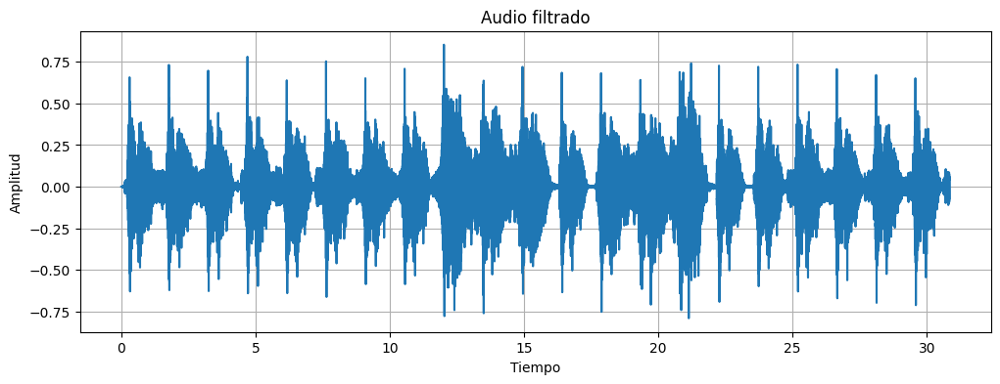

In [17]:
# grafica
plt.figure(figsize=(12,4))
plt.plot(tiempo,audio_filtrado)
plt.title("Audio filtrado")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid()
plt.show()

## Espectrograma del audio filtrado

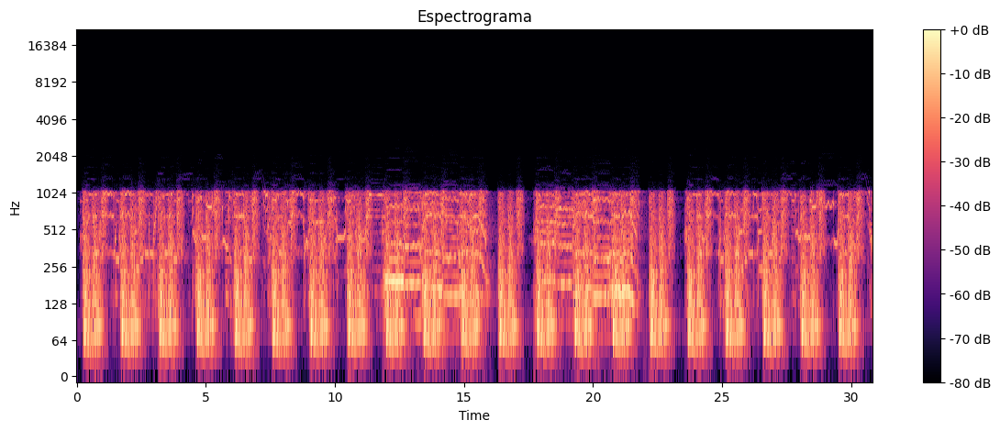

In [18]:
# Usar librosa para convertir la señal de audio a espectrograma
D_filtrado = librosa.amplitude_to_db(np.abs(librosa.stft(audio_filtrado)), ref=np.max)

# Crear el gráfico del espectrograma
plt.figure(figsize=(14, 5))
librosa.display.specshow(D_filtrado, sr=fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma')
plt.show()

# Resultados finales


## Audio original y audio filtrado

In [19]:
print("Audio original:")
Audio(audio,rate=fs)

print("Audio filtrado:")
Audio(audio_filtrado,rate=fs)

Audio original:
Audio filtrado:


## Gráficas del audio original y el audio filtrado

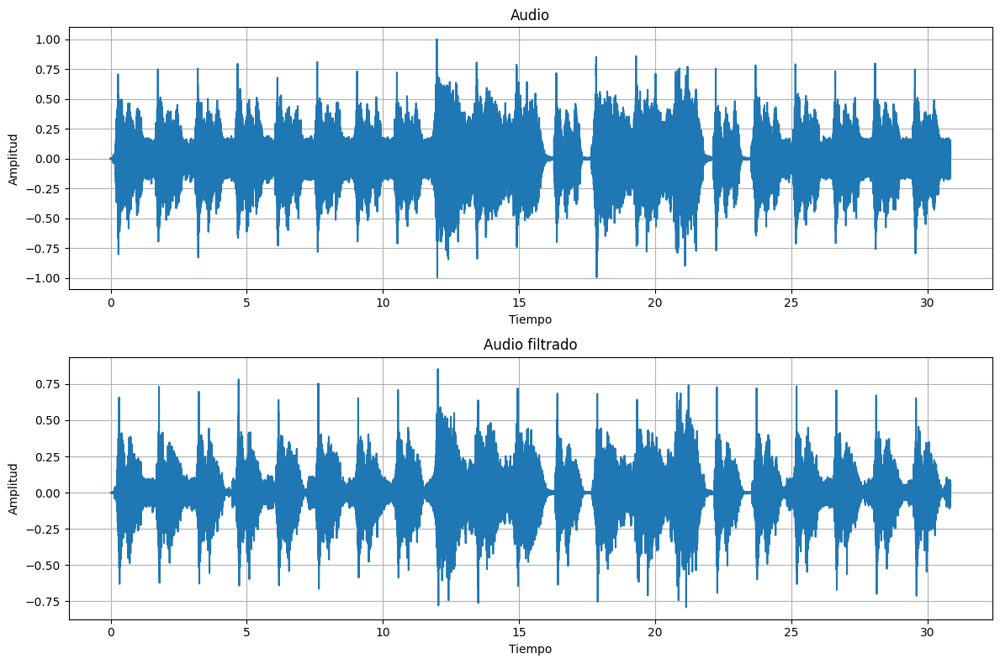

In [20]:
plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
plt.plot(tiempo,audio)
plt.title("Audio")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid()


plt.subplot(2,1,2)
plt.plot(tiempo,audio_filtrado)
plt.title("Audio filtrado")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid() 
plt.tight_layout()
plt.show()

## Espectrograma original y del audio filtrado

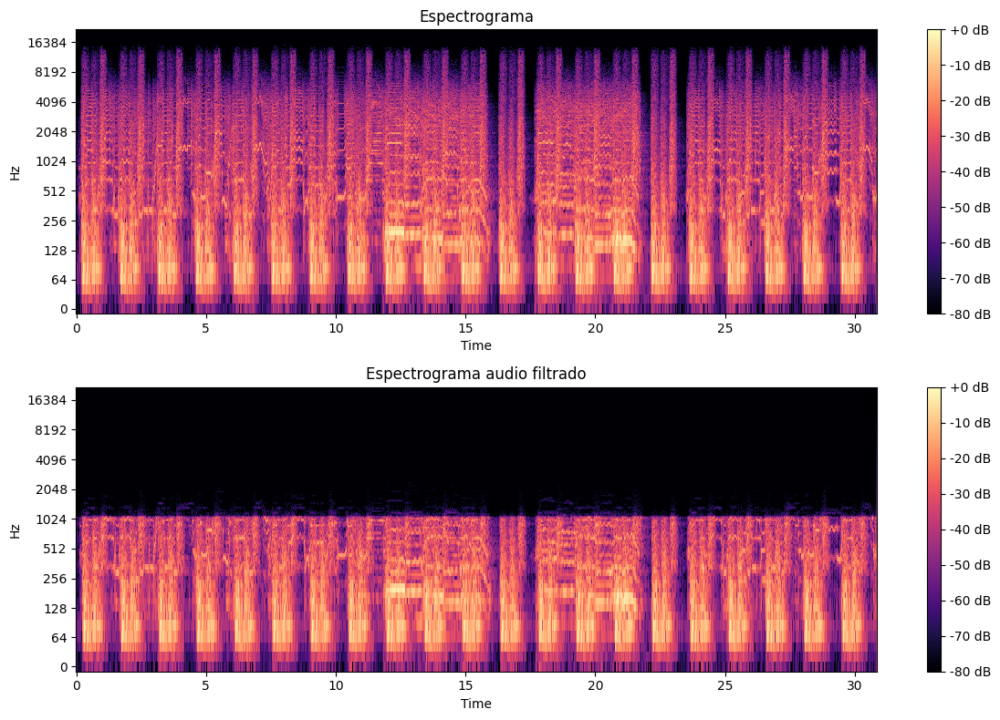

In [23]:
plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
librosa.display.specshow(D, sr=fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma')

plt.subplot(2,1,2)
librosa.display.specshow(D_filtrado, sr=fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma audio filtrado')
plt.tight_layout()
plt.show()
